In [1]:
import tensorflow as tf
from tensorflow.keras.layers import ConvLSTM2D, BatchNormalization, Dropout, Conv2D
from tensorflow.keras.models import Sequential

def create_dynamic_model(time_dim=5):
    model = Sequential()

    # ConvLSTM layer with dynamic spatial dimensions
    model.add(ConvLSTM2D(filters=32, kernel_size=(3, 3),
                         input_shape=(time_dim, None, None, 1),
                         padding='same', return_sequences=False))
    model.add(BatchNormalization())
    model.add(Dropout(0.3))

    # Additional Conv2D layers
    model.add(Conv2D(filters=64, kernel_size=(3, 3), padding='same', activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.3))

    model.add(Conv2D(filters=32, kernel_size=(3, 3), padding='same', activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.3))

    # Output layer
    model.add(Conv2D(filters=1, kernel_size=(3, 3), padding='same', activation='linear'))

    return model

model = create_dynamic_model()

2023-08-31 16:32:19.856230: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-08-31 16:32:19.906393: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-08-31 16:32:19.907499: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-08-31 16:32:20.831018: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [2]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d (ConvLSTM2D)    (None, None, None, 32)    38144     
                                                                 
 batch_normalization (Batch  (None, None, None, 32)    128       
 Normalization)                                                  
                                                                 
 dropout (Dropout)           (None, None, None, 32)    0         
                                                                 
 conv2d (Conv2D)             (None, None, None, 64)    18496     
                                                                 
 batch_normalization_1 (Bat  (None, None, None, 64)    256       
 chNormalization)                                                
                                                                 
 dropout_1 (Dropout)         (None, None, None, 64)    0

In [3]:
pip install zarr-eosdis-store

Note: you may need to restart the kernel to use updated packages.


In [5]:
# Core libraries for this tutorial
# Available via `pip install zarr zarr-eosdis-store`
from eosdis_store import EosdisStore
import xarray as xr

# Other Python libraries
import requests
from pqdm.threads import pqdm
from matplotlib import animation, pyplot as plt
from IPython.core.display import display, HTML

# Python standard library imports
from pprint import pprint

/tmp/ipykernel_682/303224034.py:10: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


In [ ]:
data_provider = 'POCLOUD'
mur_short_name = 'MUR-JPL-L4-GLOB-v4.1'

plt.rcParams['figure.figsize'] = 12, 6

start_time = '2010-09-01T21:00:00Z'
end_time = '2017-09-30T20:59:59Z'

lats = slice(-5, 35)
lons = slice(45, 90)

cmr_url = 'https://cmr.earthdata.nasa.gov/search/granules.json'
response = requests.get(cmr_url, 
                        params={
                            'provider': data_provider,
                            'short_name': mur_short_name, 
                            'temporal': f'{start_time},{end_time}',
                            'bounding_box': f'{lons.start},{lats.start},{lons.stop},{lats.stop}',
                            'page_size': 2000,
                            }
                       )
granules = response.json()['feed']['entry']

urls = []
for granule in granules:
    for link in granule['links']:
        if link['rel'].endswith('/data#'):
            urls.append(link['href'])
            break
            
def open_as_zarr_xarray(url):
    return xr.open_zarr(EosdisStore(url), consolidated=False)

# datasets = pqdm(urls, open_as_zarr_xarray, n_jobs=30)
datasets = pqdm(urls, open_as_zarr_xarray, n_jobs=30)

SUBMITTING | :   0%|          | 0/2000 [00:00<?, ?it/s]

PROCESSING | :   0%|          | 0/2000 [00:00<?, ?it/s]

/srv/conda/envs/notebook/lib/python3.9/site-packages/zarr/storage.py:2919: UserWarning: Store {'.zgroup': {'zarr_format': 2}, 'analysed_sst/.zarray': {'zarr_format': 2, 'filters': [{'id': 'shuffle', 'elementsize': 2}], 'order': 'C', 'dtype': '<i2', 'shape': [1, 17999, 36000], 'compressor': {'id': 'zlib', 'level': 4}, 'chunks': [1, 1023, 2047], 'fill_value': -32768}, 'analysed_sst/.zattrs': {'long_name': 'analysed sea surface temperature', 'standard_name': 'sea_surface_foundation_temperature', 'units': 'kelvin', '_FillValue': -32768, 'add_offset': 298.15, 'scale_factor': 0.001, 'valid_min': -32767, 'valid_max': 32767, 'comment': '\\"Final\\" version using Multi-Resolution Variational Analysis (MRVA) method for interpolation', 'coordinates': 'lon lat', 'source': 'AMSRE-REMSS, AVHRR18_G-NAVO, MODIS_A-JPL, MODIS_T-JPL, iQUAM-NOAA/NESDIS, Ice_Conc-OSISAF', '_ARRAY_DIMENSIONS': ['time', 'lat', 'lon']}, 'analysed_sst/.zchunkstore': {'0.0.0': {'offset': 40752, 'size': 4083}, '0.0.1': {'offset'

In [8]:
ds = xr.concat(datasets, 'time')
ds

<xarray.Dataset>
Dimensions:           (time: 30, lat: 17999, lon: 36000)
Coordinates:
  * lat               (lat) float32 -89.99 -89.98 -89.97 ... 89.97 89.98 89.99
  * lon               (lon) float32 -180.0 -180.0 -180.0 ... 180.0 180.0 180.0
  * time              (time) datetime64[ns] 2021-09-01T09:00:00 ... 2021-09-3...
Data variables:
    analysed_sst      (time, lat, lon) float32 dask.array<chunksize=(1, 1023, 2047), meta=np.ndarray>
    analysis_error    (time, lat, lon) float32 dask.array<chunksize=(1, 1023, 2047), meta=np.ndarray>
    dt_1km_data       (time, lat, lon) timedelta64[ns] dask.array<chunksize=(1, 1447, 2895), meta=np.ndarray>
    mask              (time, lat, lon) float32 dask.array<chunksize=(1, 1447, 2895), meta=np.ndarray>
    sea_ice_fraction  (time, lat, lon) float32 dask.array<chunksize=(1, 1447, 2895), meta=np.ndarray>
    sst_anomaly       (time, lat, lon) float32 dask.array<chunksize=(1, 1023, 2047), meta=np.ndarray>
Attributes: (12/47)
    Conventions:                CF-1.7
    title:                      Daily MUR SST, Final product
    summary:                    A merged, multi-sensor L4 Foundation SST anal...
    references:                 http://podaac.jpl.nasa.gov/Multi-scale_Ultra-...
    institution:                Jet Propulsion Laboratory
    history:                    created at nominal 4-day latency; replaced nr...
    ...                         ...
    project:                    NASA Making Earth Science Data Records for Us...
    publisher_name:             GHRSST Project Office
    publisher_url:              http://www.ghrsst.org
    publisher_email:            ghrsst-po@nceo.ac.uk
    processing_level:           L4
    cdm_data_type:              grid

In [9]:
ds['time'] = ds['time'].dt.floor('D')

zarr_new = ds.sel(lat=slice(-5, 35), lon=slice(45,90))

zarr_ds = zarr_new.sortby('time')
zarr_ds = zarr_ds.sel(time=slice('2021-09-01', '2021-09-30'))
# downsampling
zarr_ds = zarr_ds.isel(lat=slice(0, None, 10), lon=slice(0, None, 10))
zarr_ds

<xarray.Dataset>
Dimensions:           (time: 30, lat: 401, lon: 451)
Coordinates:
  * lat               (lat) float32 -5.0 -4.9 -4.8 -4.7 ... 34.7 34.8 34.9 35.0
  * lon               (lon) float32 45.0 45.1 45.2 45.3 ... 89.7 89.8 89.9 90.0
  * time              (time) datetime64[ns] 2021-09-01 2021-09-02 ... 2021-09-30
Data variables:
    analysed_sst      (time, lat, lon) float32 dask.array<chunksize=(1, 71, 2), meta=np.ndarray>
    analysis_error    (time, lat, lon) float32 dask.array<chunksize=(1, 71, 2), meta=np.ndarray>
    dt_1km_data       (time, lat, lon) timedelta64[ns] dask.array<chunksize=(1, 19, 67), meta=np.ndarray>
    mask              (time, lat, lon) float32 dask.array<chunksize=(1, 19, 67), meta=np.ndarray>
    sea_ice_fraction  (time, lat, lon) float32 dask.array<chunksize=(1, 19, 67), meta=np.ndarray>
    sst_anomaly       (time, lat, lon) float32 dask.array<chunksize=(1, 71, 2), meta=np.ndarray>
Attributes: (12/47)
    Conventions:                CF-1.7
    title:                      Daily MUR SST, Final product
    summary:                    A merged, multi-sensor L4 Foundation SST anal...
    references:                 http://podaac.jpl.nasa.gov/Multi-scale_Ultra-...
    institution:                Jet Propulsion Laboratory
    history:                    created at nominal 4-day latency; replaced nr...
    ...                         ...
    project:                    NASA Making Earth Science Data Records for Us...
    publisher_name:             GHRSST Project Office
    publisher_url:              http://www.ghrsst.org
    publisher_email:            ghrsst-po@nceo.ac.uk
    processing_level:           L4
    cdm_data_type:              grid

In [10]:
import dask.array as da
from dask.delayed import delayed
from sklearn.model_selection import train_test_split
import gc

def preprocess_day_data(day_data):
    # day_data = da.squeeze(day_data)
    mean_val = da.nanmean(day_data)  # compute here to get scalar value
    return day_data - mean_val

def preprocess_data(zarr_ds, chunk_size=200):
    total_len = zarr_ds['analysed_sst'].shape[0]
    chunk_shape = (chunk_size,) + zarr_ds['analysed_sst'].shape[1:]
    chunks = []

    for start_idx in range(0, total_len, chunk_size):
        end_idx = min(start_idx + chunk_size, total_len)
        
        # Directly slice the dask array without wrapping it with da.from_array again
        chunk = zarr_ds['analysed_sst'][start_idx:end_idx]
        
        processed_chunk = chunk.map_blocks(preprocess_day_data)
        
        # Use da.where to replace NaNs with 0.0
        processed_chunk = da.where(da.isnan(processed_chunk), 0.0, processed_chunk)
        chunks.append(processed_chunk)
        
    return da.concatenate(chunks, axis=0)

processed_data = preprocess_data(zarr_ds).compute()

def prepare_data_from_processed(processed_data, window_size=5): 
    length = processed_data.shape[0]
    X, y = [], []

    for i in range(length - window_size):
        X.append(processed_data[i:i+window_size])
        y.append(processed_data[i+window_size])

    X, y = da.array(X), da.array(y)
    return X, y

X, y = prepare_data_from_processed(processed_data)

In [11]:
def time_series_split(X, y, train_ratio=0.7, val_ratio=0.2):
    total_length = X.shape[0]
    
    # Compute end indices for each split
    train_end = int(total_length * train_ratio)
    val_end = int(total_length * (train_ratio + val_ratio))
    
    X_train = X[:train_end]
    y_train = y[:train_end]
    
    X_val = X[train_end:val_end]
    y_val = y[train_end:val_end]
    
    X_test = X[val_end:]
    y_test = y[val_end:]
    
    return X_train, y_train, X_val, y_val, X_test, y_test

X_train, y_train, X_val, y_val, X_test, y_test = time_series_split(X, y)

In [ ]:
from tensorflow.keras.layers import Input, Dense, Add, LayerNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping

model.compile(optimizer='adam', loss='mse', metrics=['mse'])

early_stop = EarlyStopping(patience=5, restore_best_weights=True)

train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train))
train_dataset = train_dataset.shuffle(buffer_size=1024).batch(16)

val_dataset = tf.data.Dataset.from_tensor_slices((X_val, y_val))
val_dataset = val_dataset.batch(32)

history = model.fit(train_dataset, epochs=20, validation_data=val_dataset, callbacks=[early_stop])

Epoch 1/20
2/2 [==============================] - 35s 4s/step - loss: 3.6971 - mse: 3.6971 - val_loss: 0.5496 - val_mse: 0.5496
Epoch 2/20


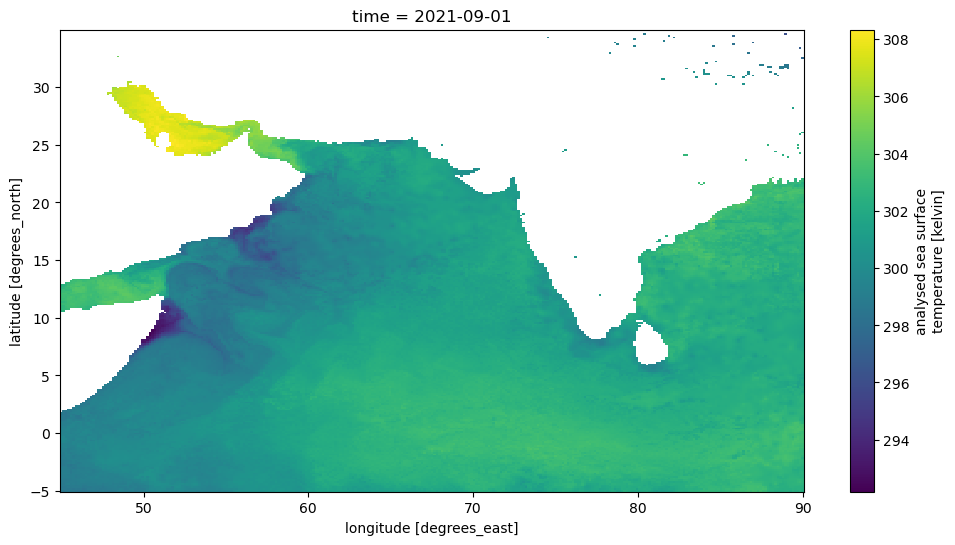

In [11]:
print(zarr_ds['analysed_sst'].isel(time=0).plot())